In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
import numpy as np
import plotly.express as px
import tkinter
from matplotlib import pyplot as plt
from sklearn.model_selection import cross_val_score
from collections import Counter

#Machine Learning
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_curve, auc, accuracy_score
from sklearn import metrics
from sklearn import ensemble
from sklearn import svm
from sklearn import neighbors
from xgboost import XGBClassifier
from sklearn import linear_model

from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import make_column_transformer

from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import make_column_transformer
from sklearn.metrics import confusion_matrix, recall_score, precision_score, f1_score, accuracy_score, roc_auc_score
from sklearn.metrics import classification_report
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import export_graphviz
from IPython.display import Image
import graphviz
from statistics import stdev
from xgboost import XGBClassifier
from statistics import stdev
from sklearn.model_selection import GridSearchCV

#for Deep Learning
import tensorflow as tf
from tensorflow import keras
from keras.models import Sequential
from keras.layers import Dense,Dropout

#for interactive dashboard
!pip install panel hvplot
import panel as pn
import holoviews as hv
import hvplot.pandas
pn.extension('tabulator')
#pd.options.plotting.backend = 'holoviews'


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 32.7 MB/s eta 0:00:00


In [ ]:
df = pd.read_csv("https://raw.githubusercontent.com/Cebelle1/SC1015Project/main/telco_churn_data.csv")

df.head()
df.shape               #(1000,14) 7k row, 46col
df.isnull().sum()      #check for nulls to clean
#df.isna().sum()      #check for missing values (result same as null)

Customer ID                             0
Referred a Friend                       0
Number of Referrals                     0
Tenure in Months                        0
Offer                                   0
Phone Service                           0
Avg Monthly Long Distance Charges       0
Multiple Lines                          0
Internet Service                        0
Internet Type                           0
Avg Monthly GB Download                 0
Online Security                         0
Online Backup                           0
Device Protection Plan                  0
Premium Tech Support                    0
Streaming TV                            0
Streaming Movies                        0
Streaming Music                         0
Unlimited Data                          0
Contract                                0
Paperless Billing                       0
Payment Method                          0
Monthly Charge                          0
Total Regular Charges             

In [ ]:
df.shape   

(7043, 46)

In [ ]:
#df.info()
df_stat = df.select_dtypes(exclude = 'string') 
df_stat.describe()

,Number of Referrals,Tenure in Months,Avg Monthly Long Distance Charges,Avg Monthly GB Download,Monthly Charge,Total Regular Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Age,Number of Dependents,Zip Code,Latitude,Longitude,Population,Churn Value,CLTV,Total Customer Svc Requests,Product/Service Issues Reported,Customer Satisfaction
count,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,1834.000000
mean,1.951867,32.386767,22.958954,21.110890,65.538800,2280.381264,1.962182,278.499225,749.099262,46.509726,0.468692,93486.070567,36.197455,-119.756684,22139.603294,0.265370,4400.295755,1.338776,0.308107,3.005453
std,3.001199,24.542061,15.448113,20.948471,30.606805,2266.220462,7.902614,685.039625,846.660055,16.750352,0.962802,1856.767505,2.468929,2.154425,21152.392837,0.441561,1183.057152,1.430471,0.717514,1.256938
min,0.000000,1.000000,0.000000,0.000000,18.250000,18.800000,0.000000,0.000000,0.000000,19.000000,0.000000,90001.000000,32.555828,-124.301372,11.000000,0.000000,2003.000000,0.000000,0.000000,1.000000
25%,0.000000,9.000000,9.210000,3.000000,35.890000,400.150000,0.000000,0.000000,70.545000,32.000000,0.000000,92101.000000,33.990646,-121.788090,2344.000000,0.000000,3469.000000,0.000000,0.000000,2.000000
50%,0.000000,29.000000,22.890000,17.000000,71.968000,1394.550000,0.000000,0.000000,401.440000,46.000000,0.000000,93518.000000,36.205465,-119.595293,17554.000000,0.000000,4527.000000,1.000000,0.000000,3.000000
75%,3.000000,55.000000,36.395000,28.000000,90.650000,3786.600000,0.000000,182.620000,1191.100000,60.000000,0.000000,95329.000000,38.161321,-117.969795,36125.000000,1.000000,5380.500000,2.000000,0.000000,4.000000
max,11.000000,72.000000,49.990000,94.000000,123.084000,8684.800000,49.790000,6477.000000,3564.720000,80.000000,9.000000,96150.000000,41.962127,-114.192901,105285.000000,1.000000,6500.000000,9.000000,6.000000,5.000000


In [ ]:
df = df.drop(columns=['Zip Code', 'Latitude', 'Longitude', 'Customer ID']) #only able to run once per runtime as its overwritting
for col in df.columns:
    c = df[col].nunique()
    print(f"Unique count of {col} is {c}")

Unique count of Referred a Friend is 2
Unique count of Number of Referrals is 12
Unique count of Tenure in Months is 72
Unique count of Offer is 6
Unique count of Phone Service is 2
Unique count of Avg Monthly Long Distance Charges is 3584
Unique count of Multiple Lines is 2
Unique count of Internet Service is 2
Unique count of Internet Type is 4
Unique count of Avg Monthly GB Download is 63
Unique count of Online Security is 2
Unique count of Online Backup is 2
Unique count of Device Protection Plan is 2
Unique count of Premium Tech Support is 2
Unique count of Streaming TV is 2
Unique count of Streaming Movies is 2
Unique count of Streaming Music is 2
Unique count of Unlimited Data is 2
Unique count of Contract is 3
Unique count of Paperless Billing is 2
Unique count of Payment Method is 3
Unique count of Monthly Charge is 2298
Unique count of Total Regular Charges is 6540
Unique count of Total Refunds is 500
Unique count of Total Extra Data Charges is 1798
Unique count of Total Long

Creating a categorical and numerical list

In [ ]:
columns = list(df.columns)

categoric_columns = []
numeric_columns = []

for i in columns:
    if len(df[i].unique()) > 6:
        numeric_columns.append(i)
    else:
        categoric_columns.append(i)

categoric_columns = categoric_columns[:-1] #exclude churn
categoric_columns.append('City')
categoric_columns.append('Churn Reason')
categoric_columns.append('Streaming')
categoric_columns.append('Age Range')


In [ ]:
#Combine the columns Streaming TV/ Streaming Movies/ Streaming Music - new column
def categorise(row):
  if row['Streaming TV'] == "Yes" or row['Streaming Movies'] == "Yes" or row['Streaming Music'] == "Yes":
    return "Yes"
  else:
    return "No"


df["Streaming"] = df.apply(lambda row: categorise(row), axis=1)

In [ ]:
#Categorising the Age values into groups i.e. Below 39 (Adult), 40-60 (Middle-Aged), 61+ (Elderly)
#def categorise2(row):
#  if row("Age") < 40:
#    return "Below 39"
#  elif 41 < row("Age") < 61:
#    return "40 to 60"
#  elif row("Age") > 60:
#    return "61+"
#
#df["Age Range"] = df.apply(lambda row: categorise2(row), axis=1)

TypeError: ignored

In [ ]:
df["Age Range"] = np.nan
df["Age Range"].loc[(df.Age < 40)] = "Below 40"
df["Age Range"].loc[(df.Age >= 40 )& (df.Age <60)] = "Between 40 & 60"
df["Age Range"].loc[(df.Age >= 60 )] = "Above 60"

<ipython-input-8-f59844bd197e>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["Age Range"].loc[(df.Age < 40)] = "Below 40"


In [ ]:
df

,Referred a Friend,Number of Referrals,Tenure in Months,Offer,Phone Service,Avg Monthly Long Distance Charges,Multiple Lines,Internet Service,Internet Type,Avg Monthly GB Download,...,Population,Churn Value,CLTV,Churn Category,Churn Reason,Total Customer Svc Requests,Product/Service Issues Reported,Customer Satisfaction,Streaming,Age Range
0,No,0,1,None,No,0.00,No,Yes,Fiber Optic,9,...,68701,1,5433,Competitor,Competitor offered more data,5,0,NaN,Yes,Above 60
1,Yes,1,8,Offer E,Yes,48.85,Yes,Yes,Cable,19,...,55668,1,5302,Competitor,Competitor made better offer,5,0,NaN,No,Above 60
2,No,0,18,Offer D,Yes,11.33,Yes,Yes,Fiber Optic,57,...,47534,1,3179,Competitor,Competitor made better offer,1,0,NaN,Yes,Above 60
3,Yes,1,25,Offer C,Yes,19.76,No,Yes,Fiber Optic,13,...,27778,1,5337,Dissatisfaction,Limited range of services,1,1,2.0,Yes,Above 60
4,Yes,1,37,Offer C,Yes,6.33,Yes,Yes,Cable,15,...,26265,1,2793,Price,Extra data charges,1,0,2.0,No,Above 60
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,No,0,72,None,Yes,22.77,No,No,None,0,...,2182,0,5306,NaN,NaN,0,0,NaN,No,Below 40
7039,Yes,1,24,Offer C,Yes,36.05,Yes,Yes,DSL,24,...,18980,0,2140,NaN,NaN,2,0,NaN,Yes,Below 40
7040,Yes,4,72,None,Yes,29.66,Yes,Yes,Cable,59,...,42,0,5560,NaN,NaN,2,0,4.0,Yes,Below 40
7041,Yes,1,11,None,No,0.00,No,Yes,DSL,17,...,301,0,2793,NaN,NaN,0,0,NaN,No,Below 40


# Exploratory Data Analysis

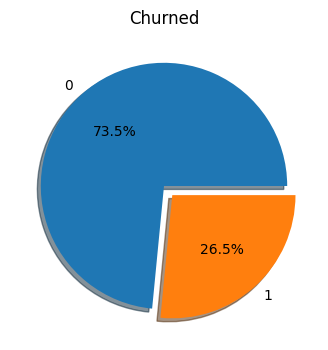

In [ ]:
f, ax = plt.subplots(1, figsize=(4, 4))
df['Churn Value'].value_counts().plot(kind='pie',explode=[0, 0.1], autopct='%1.1f%%', shadow=True)
ax.set_title('Churned')
ax.set_ylabel('')


plt.show()

The average churn rate for a Telco Company is around 22%. Ours is slightly higher by abit, nevertheless we should try and reduce it. 

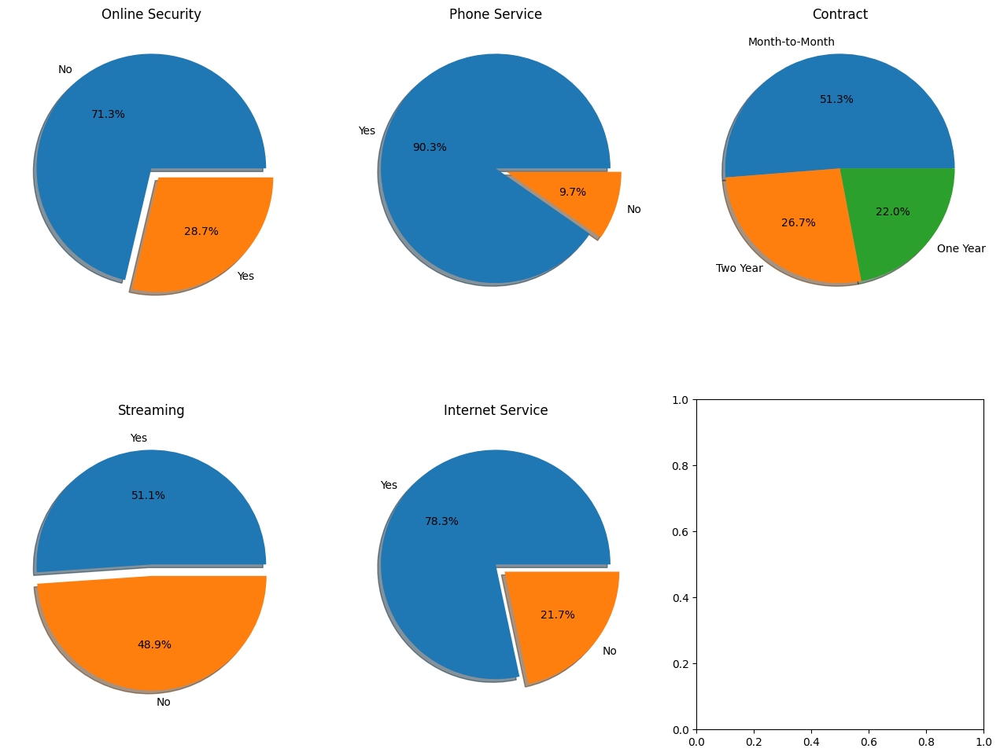

In [ ]:
f, ax = plt.subplots(2, 3, figsize=(16, 12))

df['Online Security'].value_counts().plot.pie(explode=[0, 0.1], autopct='%1.1f%%', ax=ax[0][0], shadow=True)
ax[0][0].set_title('Online Security')
ax[0][0].set_ylabel('')

df['Phone Service'].value_counts().plot.pie(explode=[0, 0.1], autopct='%1.1f%%', ax=ax[0][1], shadow=True)
ax[0][1].set_title('Phone Service')
ax[0][1].set_ylabel('')

df['Streaming'].value_counts().plot.pie(explode=[0, 0.1], autopct='%1.1f%%', ax=ax[1][0], shadow=True)
ax[1][0].set_title('Streaming')
ax[1][0].set_ylabel('')

df['Internet Service'].value_counts().plot.pie(explode=[0, 0.1], autopct='%1.1f%%', ax=ax[1][1], shadow=True)
ax[1][1].set_title('Internet Service')
ax[1][1].set_ylabel('')

df['Contract'].value_counts().plot.pie(autopct='%1.1f%%', ax=ax[0][2], shadow=True)
ax[0][2].set_title('Contract')
ax[0][2].set_ylabel('')

plt.show()



*   Most of the customers are on Monthly Contracts (Not desireable)



## Categorical vs Churn

### Internet Type vs Churn

In [ ]:
plot = df.hvplot.hist("Churn Value", by="Internet Type", subplots=True, width=250)
pn.Row( plot)

Row
    [0] HoloViews(NdLayout)

<Axes: xlabel='Internet Type'>

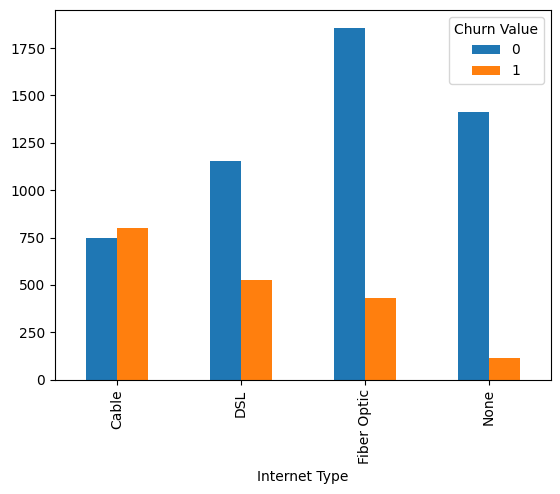

In [ ]:
df.groupby(['Internet Type', 'Churn Value']).size().unstack().plot(kind='bar', stacked=False)

### Offer Vs Churn

In [ ]:
plot = df.hvplot.hist("Churn Value", by="Offer", subplots=True, width=250)
pn.Row( plot)

Row
    [0] HoloViews(NdLayout)

<Axes: xlabel='Offer'>

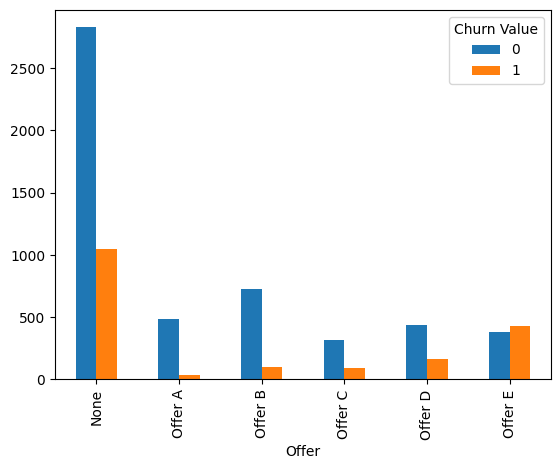

In [ ]:
df.groupby(['Offer', 'Churn Value']).size().unstack().plot(kind='bar', stacked=False)

<Axes: xlabel='Age Range'>

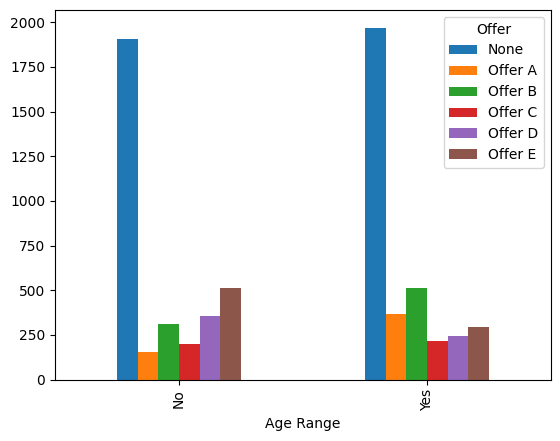

In [ ]:
df.groupby(['Age Range', 'Offer']).size().unstack().plot(kind='bar', stacked=False)

### Phone Service vs Churn

In [ ]:
plot = df.hvplot.hist("Churn Value", by="Phone Service", subplots=True, width=250)
pn.Row( plot)

Row
    [0] HoloViews(NdLayout)

<Axes: xlabel='Phone Service'>

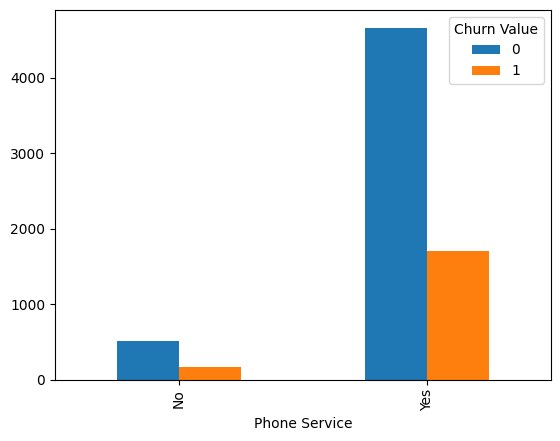

In [ ]:
df.groupby(['Phone Service', 'Churn Value']).size().unstack().plot(kind='bar', stacked=False)

### Streaming vs Churn

In [ ]:
plot = df.hvplot.hist("Churn Value", by=["Streaming TV","Streaming Movies","Streaming Music"], subplots=True, width=400)
pn.Row( plot)

Row
    [0] HoloViews(NdLayout)

<Axes: xlabel='Streaming Music'>

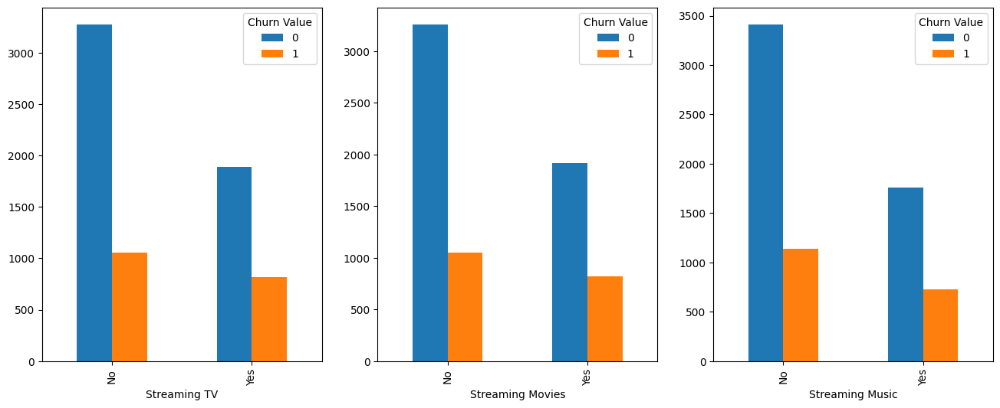

In [ ]:
f, ax = plt.subplots(1, 3, figsize=(16, 6))
df.groupby(['Streaming TV', 'Churn Value']).size().unstack().plot(kind='bar', stacked=False, ax=ax[0])
df.groupby(['Streaming Movies', 'Churn Value']).size().unstack().plot(kind='bar', stacked=False, ax=ax[1])
df.groupby(['Streaming Music', 'Churn Value']).size().unstack().plot(kind='bar', stacked=False, ax=ax[2])

In [ ]:
plot = df.hvplot.hist("Churn Value", by=["Internet Service"], subplots=True, width=400)
pn.Row( plot)

Row
    [0] HoloViews(NdLayout)

<Axes: xlabel='Internet Service'>

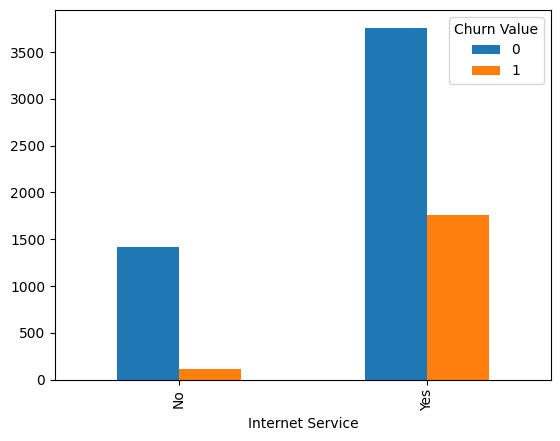

In [ ]:
df.groupby(['Internet Service', 'Churn Value']).size().unstack().plot(kind='bar', stacked=False)

In [ ]:
plot = df.hvplot.hist("Churn Value", by=["Multiple Lines"], subplots=True, width=400)
pn.Row( plot)

Row
    [0] HoloViews(NdLayout)

<Axes: xlabel='Multiple Lines'>

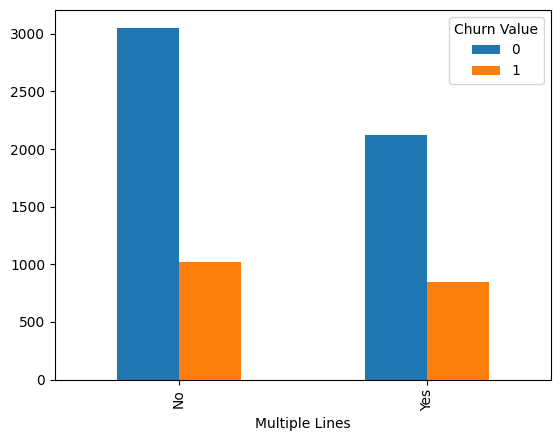

In [ ]:
df.groupby(['Multiple Lines', 'Churn Value']).size().unstack().plot(kind='bar', stacked=False)

### Numerical Columns vs Churn

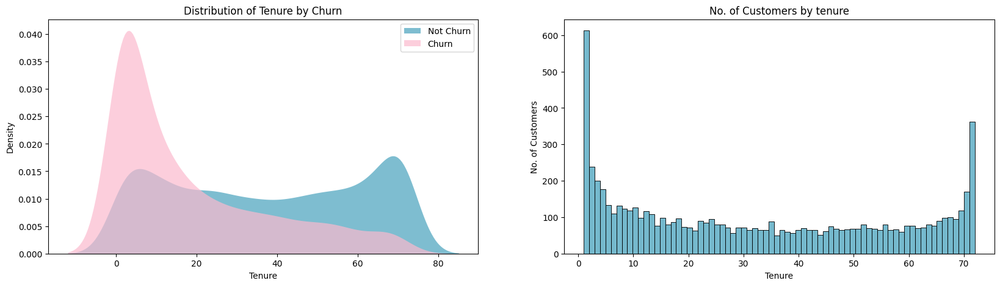

In [ ]:
fig = plt.subplots(nrows = 1,ncols = 2,figsize = (20,5))
df_num_churn = df
df_num_churn = df_num_churn.rename(columns={'Churn Value': 'Churn'})
df_num_churn = df_num_churn.rename(columns={'Tenure in Months': 'Tenure'})
df_num_churn = df_num_churn.rename(columns={'Monthly Charge': 'MonthlyCharge'})
df_num_churn = df_num_churn.rename(columns={'Total Regular Charges': 'TotalCharges'})
df_num_churn['Churn'].replace(to_replace='Yes', value=1, inplace=True)
df_num_churn['Churn'].replace(to_replace='No',  value=0, inplace=True)


plt.subplot(1,2,1)
ax = sb.kdeplot(df_num_churn.Tenure[(df_num_churn["Churn"] == 0)], color='#47A2BD', fill= True, alpha=.7, linewidth=0)
ax = sb.kdeplot(df_num_churn.Tenure[(df_num_churn["Churn"] == 1)], color='#FBBACE', fill= True, alpha=.7, linewidth=0)
ax.legend(["Not Churn","Churn"],loc='upper right')
ax.set_ylabel('Density')
ax.set_xlabel('Tenure')
ax.set_title('Distribution of Tenure by Churn')

plt.subplot(1,2,2)
ax = sb.histplot(df_num_churn["Tenure"], bins=72, kde=False, color='#47A2BD')
ax.set(title = "No. of Customers by tenure")
ax.set_ylabel('No. of Customers')
ax.set_xlabel('Tenure')

plt.show()

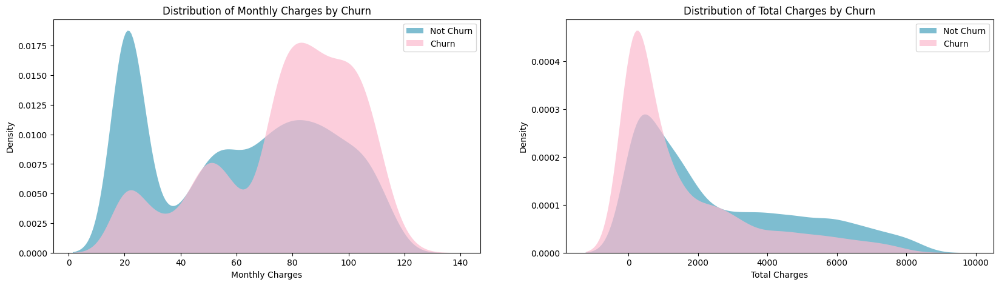

In [ ]:
fig = plt.subplots(nrows = 1,ncols = 2,figsize = (20,5))


plt.subplot(1,2,1)
ax = sb.kdeplot(df_num_churn.MonthlyCharge[(df_num_churn["Churn"] == 0)], color='#47A2BD', fill= True, alpha=.7, linewidth=0)
ax = sb.kdeplot(df_num_churn.MonthlyCharge[(df_num_churn["Churn"] == 1)], color='#FBBACE', fill= True, alpha=.7, linewidth=0)
ax.legend(["Not Churn","Churn"],loc='upper right')
ax.set_ylabel('Density')
ax.set_xlabel('Monthly Charges')
ax.set_title('Distribution of Monthly Charges by Churn')

plt.subplot(1,2,2)
ax = sb.kdeplot(df_num_churn.TotalCharges[(df_num_churn["Churn"] == 0)], color='#47A2BD', fill= True, alpha=.7, linewidth=0)
ax = sb.kdeplot(df_num_churn.TotalCharges[(df_num_churn["Churn"] == 1)], color='#FBBACE', fill= True, alpha=.7, linewidth=0)
ax.legend(["Not Churn","Churn"],loc='upper right')
ax.set_ylabel('Density')
ax.set_xlabel('Total Charges')
ax.set_title('Distribution of Total Charges by Churn')
plt.show()



*   More customers are Churning when their Monthly Charges is high



Text(0.5, 0, 'Tenure (months)')

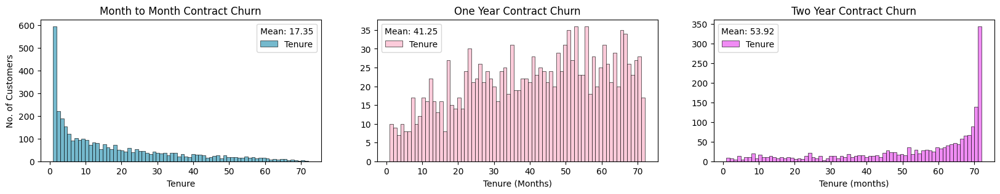

In [ ]:
fig = plt.subplots(nrows=1, ncols=3, figsize = (20,3))

two_year_mean = round(df_num_churn[df_num_churn['Contract']=='Two Year']['Tenure'].mean(),2)
month_mean = round(df_num_churn[df_num_churn['Contract']=='Month-to-Month']['Tenure'].mean(),2)
year_mean = round(df_num_churn[df_num_churn['Contract']=='One Year']['Tenure'].mean(),2)

plt.subplot(1,3,1)
ax = sb.histplot(df_num_churn[df_num_churn['Contract']=='Month-to-Month']['Tenure'], bins=72, color = '#47A2BD')
ax.legend(['Tenure'],loc='upper right', title=(f'Mean: {month_mean}'))
ax.set_ylabel('No. of Customers')
ax.set_xlabel('Tenure')
ax.set_title('Month to Month Contract Churn')

plt.subplot(1,3,2)
ax = sb.histplot(df_num_churn[df_num_churn['Contract']=='One Year']['Tenure'], bins=72, color = '#FBBACE')
ax.set_title('One Year Contract Churn')
ax.set_ylabel('')
ax.set_xlabel('Tenure (Months)')
ax.legend(['Tenure'],loc='upper left', title=(f'Mean: {year_mean}'))

plt.subplot(1,3,3)
ax = sb.histplot(df_num_churn[df_num_churn['Contract']=='Two Year']['Tenure'], bins=72, color = '#EC66F1')
ax.legend(['Tenure'],loc='upper left', title=(f'Mean: {two_year_mean}'))
ax.set_title('Two Year Contract Churn')
ax.set_ylabel('')
ax.set_xlabel('Tenure (months)')

#plt.show()


Alot of customers churn just after a month

*   Many customers churn after 1 month (Month-Month Contract)
*   **The mean shows that the longer the contract, the higher the chance the customer would stay would us**




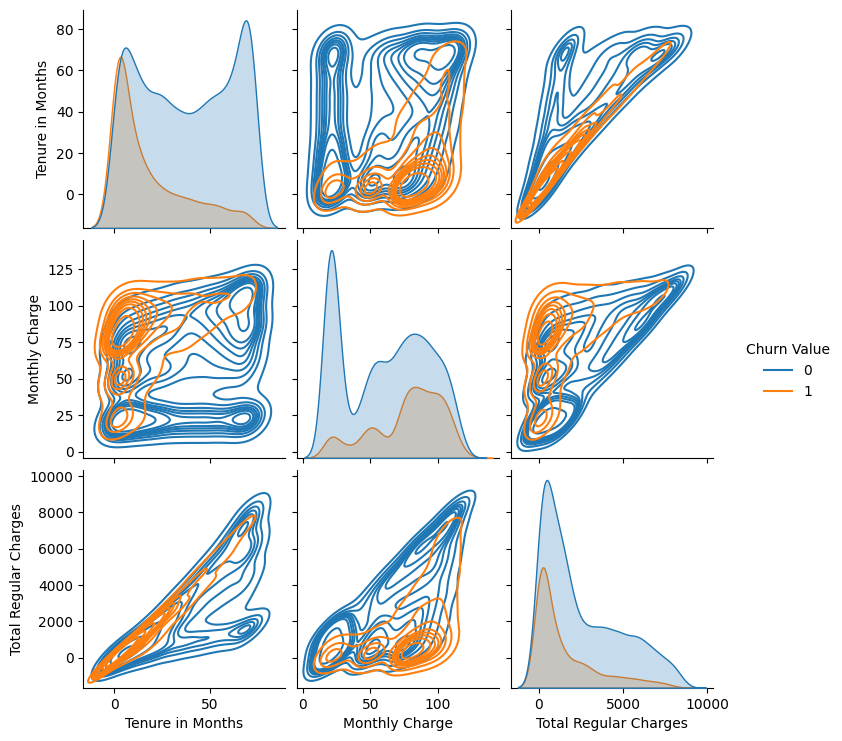

In [ ]:

sb.pairplot(df,vars = ['Tenure in Months','Monthly Charge','Total Regular Charges'], hue="Churn Value", kind = 'kde')




*  Added from the previous few graphs and insights, the pattern observed is that
 **customer with low tenure and higher monthly charges tend to churn.** (Middle Left Chart)
 



<Axes: xlabel='Customer Satisfaction', ylabel='Total Long Distance Charges'>

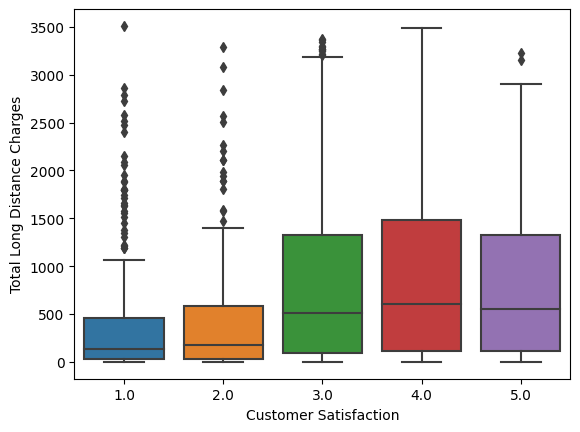

In [ ]:
sb.boxplot(data=df,x="Customer Satisfaction",y="Total Long Distance Charges")

In [ ]:
x = pn.widgets.Select(name='x', options=['Total Regular Charges', 'Tenure in Months', 'Churn Category', 'Customer Satisfaction', 'Number of Referrals'])
y = pn.widgets.Select(name='y', options=['Total Regular Charges', 'Tenure in Months', 'Churn Category', 'Customer Satisfaction', 'Number of Referrals'])
kind = pn.widgets.Select(name='kind', value='scatter', options=['scatter','bivariate'])
by_species = pn.widgets.Checkbox(name='By species')
color = pn.widgets.ColorPicker(value='#ff0000')

@pn.depends(by_species, color)
def by_species_fn(by_species, color):
    return 'species' if by_species else color

plot = df.hvplot(x=x, y=y, kind=kind, c=by_species_fn, colorbar=False, width=600, legend='top_right')

pn.Row(pn.WidgetBox(x, y, kind, color, by_species), plot)

Row
    [0] WidgetBox
        [0] Select(name='x', options=['Total Regular Charges', ...], value='Total Regular Charges')
        [1] Select(name='y', options=['Total Regular Charges', ...], value='Total Regular Charges')
        [2] Select(name='kind', options=['scatter', 'bivariate'], value='scatter')
        [3] ColorPicker(value='#ff0000')
        [4] Checkbox(name='By species')
    [1] ParamFunction(function, _pane=HoloViews)

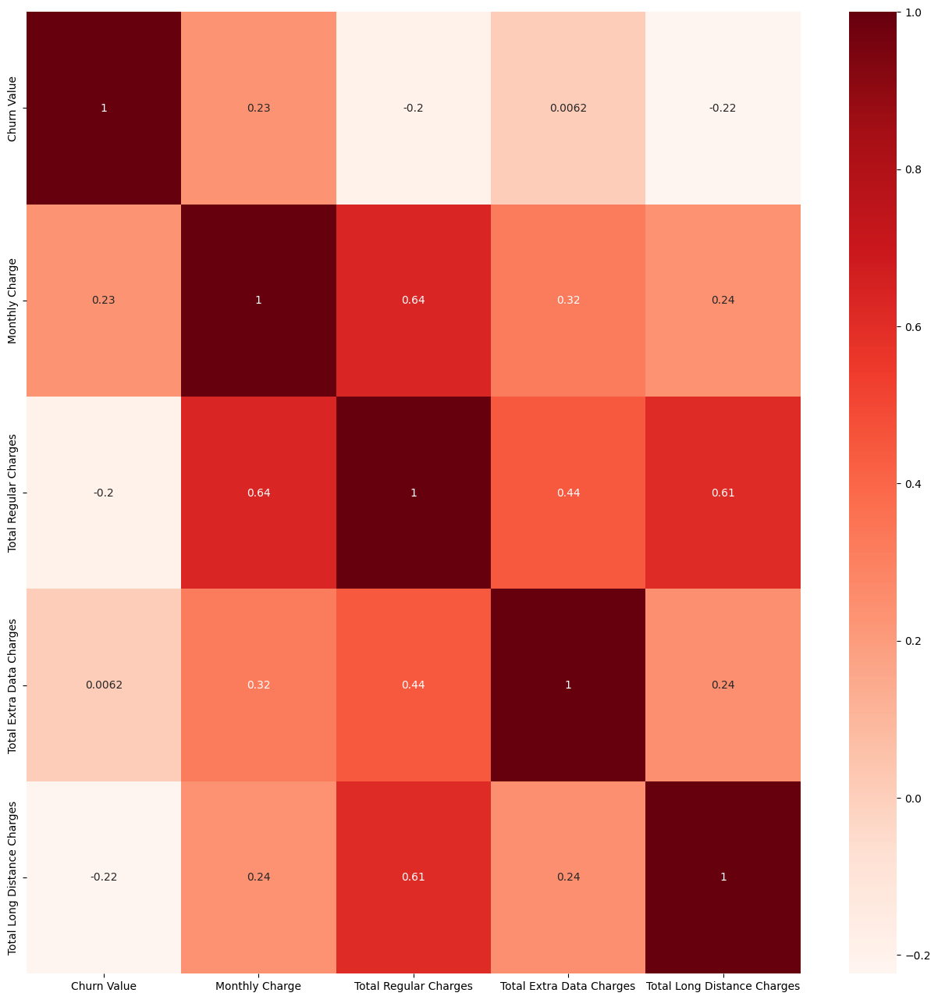

In [ ]:
#Created a correlation table for "Churn Value","Monthly Charge","Total Regular Charges","Total Extra Data Charges",
#"Total Long Distance Charges" Variable and find out the varaible most correlated to churn value. The others will be dropped.
plt.figure(figsize=(16,16))
cor = df[["Churn Value","Monthly Charge","Total Regular Charges","Total Extra Data Charges","Total Long Distance Charges"]].corr()
sb.heatmap(cor, annot=True, cmap=plt.cm.Reds)
plt.show()

In [ ]:
#functions to identify the highest correlation variables
def get_redundant_pairs(df):
    '''Get diagonal and lower triangular pairs of correlation matrix'''
    pairs_to_drop = set()
    cols = df.columns
    for i in range(0, df.shape[1]):
        for j in range(0, i+1):
            pairs_to_drop.add((cols[i], cols[j]))
    return pairs_to_drop


def get_top_abs_correlations(df, n=5):
    au_corr = df.corr().abs().unstack()
    labels_to_drop = get_redundant_pairs(df)
    au_corr = au_corr.drop(labels=labels_to_drop).sort_values(ascending=False)
    return au_corr[0:n]


#Correlation with output variable
#or_target = abs(cor["Churn Value"])
#Selecting highly correlated features
#relevant_features = cor_target[cor_target>0.4]
#rint(prelevant_features)
#
#turns out to be none
#relevant_features = cor_target[cor_target< -0.4]
#rint(nrelevant_features)

get_top_abs_correlations(cor,20)

Churn Value               Total Regular Charges          0.893959
                          Total Long Distance Charges    0.886651
Total Regular Charges     Total Long Distance Charges    0.736423
Monthly Charge            Total Regular Charges          0.521056
Churn Value               Total Extra Data Charges       0.516795
Total Regular Charges     Total Extra Data Charges       0.358137
Churn Value               Monthly Charge                 0.161575
Total Extra Data Charges  Total Long Distance Charges    0.120570
Monthly Charge            Total Long Distance Charges    0.032060
                          Total Extra Data Charges       0.007759
dtype: float64

# Training Models

Imbalance data (eg. only 26.5%) churned means need stratified splitting. 


*   false negative is more serious than false positive, since our objective is to prevent churn.
*   List item



In [ ]:
df.columns

Index(['Referred a Friend', 'Number of Referrals', 'Tenure in Months', 'Offer',
       'Phone Service', 'Avg Monthly Long Distance Charges', 'Multiple Lines',
       'Internet Service', 'Internet Type', 'Avg Monthly GB Download',
       'Online Security', 'Online Backup', 'Device Protection Plan',
       'Premium Tech Support', 'Streaming TV', 'Streaming Movies',
       'Streaming Music', 'Unlimited Data', 'Contract', 'Paperless Billing',
       'Payment Method', 'Monthly Charge', 'Total Regular Charges',
       'Total Refunds', 'Total Extra Data Charges',
       'Total Long Distance Charges', 'Gender', 'Age', 'Under 30',
       'Senior Citizen', 'Married', 'Dependents', 'Number of Dependents',
       'City', 'Population', 'Churn Value', 'CLTV', 'Churn Category',
       'Churn Reason', 'Total Customer Svc Requests',
       'Product/Service Issues Reported', 'Customer Satisfaction', 'Streaming',
       'Age Range'],
      dtype='object')

Instead of Train_Test_Split, which uses normal user-defined ratio partition, we need a stratified partition since our data has imbalanced churn. 

Use Sklearn's StratifiedKFold.

In [ ]:

le = LabelEncoder()
ann_data = df
ann_data[['Churn Value']] = ann_data[['Churn Value']].apply(le.fit_transform) # Applying LabelEncoder to 'Churn' column

X = ann_data.drop('Churn Value', axis=1)
y = ann_data['Churn Value']

X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size = 0.25, random_state = 42)

In [ ]:

#Encode multiple cols
transformer = make_column_transformer(
    (OneHotEncoder(handle_unknown='ignore'), 
     ['Gender', 'Senior Citizen', 'Married', 'Dependents', 
      'Phone Service', 'Multiple Lines', 'Internet Service', 
      'Online Security', 'Online Backup', 'Device Protection Plan', 
      'Premium Tech Support', 'Streaming TV', 'Streaming Movies', 
      'Contract', 'Paperless Billing', 'Payment Method']))

In [ ]:
print(categoric_columns)
categoric_columns.remove('Churn Value')
#categoric_columns.remove()

['Referred a Friend', 'Offer', 'Phone Service', 'Multiple Lines', 'Internet Service', 'Internet Type', 'Online Security', 'Online Backup', 'Device Protection Plan', 'Premium Tech Support', 'Streaming TV', 'Streaming Movies', 'Streaming Music', 'Unlimited Data', 'Contract', 'Paperless Billing', 'Payment Method', 'Gender', 'Under 30', 'Senior Citizen', 'Married', 'Dependents', 'Churn Value', 'Churn Category', 'City', 'Churn Reason', 'Streaming', 'Age Range']


In [ ]:
# Transforming
transformed = transformer.fit_transform(X_train)
# Transformating back
transformed_df = pd.DataFrame(transformed, columns=transformer.get_feature_names_out())
# One-hot encoding removed index. Let's put it back:
transformed_df.index = X_train.index

# Joining tables
X_train = pd.concat([X_train, transformed_df], axis=1)

X_train.drop(categoric_columns, axis=1, inplace=True) # Dropping categorical columns
X_train

,Number of Referrals,Tenure in Months,Avg Monthly Long Distance Charges,Avg Monthly GB Download,Monthly Charge,Total Regular Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Age,...,onehotencoder__Streaming Movies_No,onehotencoder__Streaming Movies_Yes,onehotencoder__Contract_Month-to-Month,onehotencoder__Contract_One Year,onehotencoder__Contract_Two Year,onehotencoder__Paperless Billing_No,onehotencoder__Paperless Billing_Yes,onehotencoder__Payment Method_Bank Withdrawal,onehotencoder__Payment Method_Credit Card,onehotencoder__Payment Method_Mailed Check
6764,5,29,36.70,69,69.050,1958.45,0.00,135.13,1064.30,26,...,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0
1923,0,9,0.00,53,60.840,539.85,0.00,286.00,0.00,30,...,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
3483,7,72,0.00,15,65.100,4754.30,0.00,713.00,0.00,53,...,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
1165,0,3,14.60,78,77.376,229.55,8.74,179.00,43.80,21,...,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
2432,1,6,1.86,21,57.512,324.25,0.00,68.00,11.16,49,...,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5006,1,27,18.42,26,95.000,2462.55,0.00,640.00,497.34,21,...,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
2964,6,53,11.35,0,19.850,1039.45,14.67,0.00,601.55,60,...,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0
6507,1,19,31.85,0,20.150,387.70,2.97,0.00,605.15,48,...,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0
3870,0,10,34.47,0,24.800,223.90,0.00,0.00,344.70,61,...,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0


In [ ]:
# Transforming
transformed = transformer.transform(X_test)
# Transformating back
transformed_df = pd.DataFrame(transformed, columns=transformer.get_feature_names_out())
# One-hot encoding removed index. Let's put it back:
transformed_df.index = X_test.index

# Joining tables
X_test = pd.concat([X_test, transformed_df], axis=1)

X_test.drop(categoric_columns, axis=1, inplace=True) # Dropping categorical columns

### Deep Learning Neural Network

Convolutional Neural Network (CNN) was chosen because of the nature of our prediction. We do not need Recurrent Neural Network (RNN) as that has the capability to remember previous data. 

We build our own model with references from other projects. 
A Sequential model is used.
Dense layers size set with references.
Dropout layer to drop neurons to reduce overfitting

In [ ]:
df3 = df

X= df3
df3 = df3.rename(columns={'Churn Value': 'Churn'})
X.drop(categoric_columns, axis=1, inplace=True) # Dropping categorical columns
y=df3.Churn.values
#X.drop('Churn',1)
#X.drop('Customer Satisfaction', 1)
X.shape

(7043, 17)

In [ ]:


features = X.columns.values
scaler = MinMaxScaler(feature_range = (0,1))
scaler.fit(X)
#X = pd.DataFrame(scaler.transform(X))
#X.columns = features
#y=df1['Churn']
#
#X_train=X.iloc[:3993,:]
#X_test=X.iloc[3993:,:]
#y_train=df1.iloc[:3993,:]['Churn']
#y_test=df1.iloc[3993:,:]['Churn']

MinMaxScaler()

I have tweaked the model.
Increased layers for learning, increased regularizer for stronger regularization penalty.
layers before the activation layer have function relu because if prob =0 just make it 0. （also, for cases like ours, hidden layers should use relu unless theres a lot of layers than use swish)

altho the code runs, i think there is somewhere wrong because the graph below isnt suppose to be stragith lines. it should have fluctuations. but to troubleshoot this requires me to dive deep into each data variable to check where went wrong and i dont think i can do that. so ermm sry i think our final model would not be this model. +i went to find website, their proper model is 0.80 accuracy, which i think your models can surpass easily. 

as for the explaination for why we dont want this model, i think we can just say that this was an attempt to create our own deep learing model, but (if possible, use accuracy to kick this model out). but if not possible, can say the training and testing results show that there are errors somewhere, which is resulting in no changes in the accruacy. 

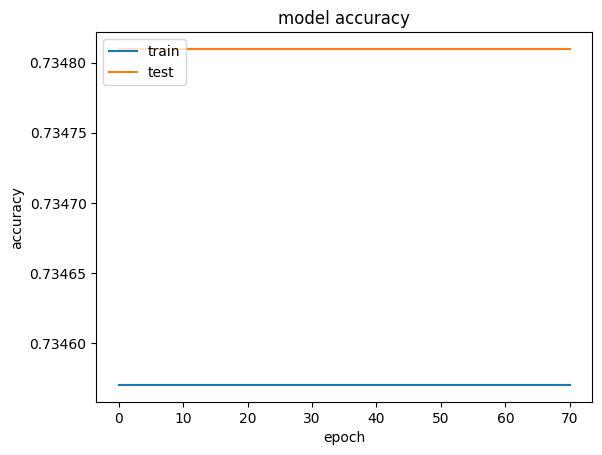

In [ ]:


nn_model = Sequential()
nn_model.add(Dense(64, kernel_regularizer=tf.keras.regularizers.l2(0.001), input_dim=50, activation='relu'))
nn_model.add(Dropout(rate=0.2))
nn_model.add(Dense(32, kernel_regularizer=tf.keras.regularizers.l2(0.001), activation='relu'))
nn_model.add(Dropout(rate=0.1))
nn_model.add(Dense(16, kernel_regularizer=tf.keras.regularizers.l2(0.001), activation='relu'))
nn_model.add(Dropout(rate=0.1))
nn_model.add(Dense(8, kernel_regularizer=tf.keras.regularizers.l2(0.001), activation='relu'))
nn_model.add(Dropout(rate=0.1))
nn_model.add(Dense(1, activation='sigmoid'))
lr_schedule = tf.keras.optimizers.schedules.InverseTimeDecay( 0.001,
      decay_steps=(X_train.shape[0]/32)*50,
      decay_rate=1,
      staircase=False)
#This time decay means for every 50 epochs the learning rate will be half of 0.001 value
def get_optimizer():
    return tf.keras.optimizers.Adam(lr_schedule)
def get_callbacks():
    return [tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',patience=70,restore_best_weights=True)]
nn_model.compile(loss = "binary_crossentropy", 
                  optimizer = get_optimizer(), 
                  metrics=['accuracy'])
    

history = nn_model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=150, batch_size=32,   callbacks=get_callbacks(),verbose=0)

plt.plot(history.history['accuracy']) 
plt.plot(history.history['val_accuracy']) 
plt.title('model accuracy') 
plt.ylabel('accuracy')
plt.xlabel('epoch') 
plt.legend(['train', 'test'], loc='upper left') 
plt.show()

In [ ]:
#function takes in raw x, y, and ML class. Performs Stratified K Fold split, throw into model return the predictions
def stratified_train(X, y, clf_class, shuffle=True,  **kwargs):
    stratified_k_fold = StratifiedKFold().split(X,y)
    y_pred = y.copy()
    classifiers = []  # Store trained classifiers
    accuracies = []  # Store accuracy scores for each fold
    fprs, tprs, aucs = [], [], []  # Store FPR, TPR, AUC for each fold

    for ii, jj in stratified_k_fold: 
        Xtrain, Xtest = X.iloc[ii], X.iloc[jj]
        ytrain = y.iloc[ii]
        if(clf_class == svm.SVC):
          clf = clf_class(probability = True, **kwargs)
        else:
          clf = clf_class(**kwargs)
        clf.fit(Xtrain, ytrain)
        classifiers.append(clf)  # Store trained classifier
        y_pred.iloc[jj] = clf.predict(Xtest)

        # Calculate accuracy score for current fold
        accuracy = accuracy_score(y.iloc[jj], y_pred.iloc[jj])
        accuracies.append(accuracy)

        # Calculate ROC curve and AUC for current fold
        fpr, tpr, _ = roc_curve(y.iloc[jj], clf.predict_proba(Xtest)[:, 1])
        auc_value = auc(fpr, tpr)
        fprs.append(fpr)
        tprs.append(tpr)
        aucs.append(auc_value)

        # Plot ROC curve for current fold
        plt.plot(fpr, tpr, label='Fold {}, AUC = {:.2f}'.format(len(accuracies), auc_value))

    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc='lower right')
    plt.show()

    # Print accuracy score for each fold
    for i in range(len(accuracies)):
        print('Fold {}: Accuracy = {:.2f}'.format(i+1, accuracies[i]))

    return y_pred, classifiers

ML

In [ ]:
df1 = df
#Turn df into numeric cols only since training can only recog numbers
df1['Churn Value'].replace(to_replace='Yes', value=1, inplace=True)
df1['Churn Value'].replace(to_replace='No',  value=0, inplace=True)
df
df2 = df1;
df2.drop(['Customer Satisfaction'], axis = 'columns', inplace = True)
df2

,Number of Referrals,Tenure in Months,Avg Monthly Long Distance Charges,Avg Monthly GB Download,Monthly Charge,Total Regular Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Age,Number of Dependents,Population,Churn Value,CLTV,Total Customer Svc Requests,Product/Service Issues Reported
0,0,1,0.00,9,41.236,39.65,0.00,0.0,0.00,78,0,68701,1,5433,5,0
1,1,8,48.85,19,83.876,633.30,0.00,120.0,390.80,74,1,55668,1,5302,5,0
2,0,18,11.33,57,99.268,1752.55,45.61,0.0,203.94,71,3,47534,1,3179,1,0
3,1,25,19.76,13,102.440,2514.50,13.43,327.0,494.00,78,1,27778,1,5337,1,1
4,1,37,6.33,15,79.560,2868.15,0.00,430.0,234.21,80,1,26265,1,2793,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,0,72,22.77,0,21.150,1419.40,19.31,0.0,1639.44,30,0,2182,0,5306,0,0
7039,1,24,36.05,24,84.800,1990.50,48.23,0.0,865.20,38,2,18980,0,2140,2,0
7040,4,72,29.66,59,103.200,7362.90,45.38,4344.0,2135.52,30,2,42,0,5560,2,0
7041,1,11,0.00,17,29.600,346.45,27.24,0.0,0.00,32,2,301,0,2793,0,0


In [ ]:
df3

,Referred a Friend,Number of Referrals,Tenure in Months,Offer,Phone Service,Avg Monthly Long Distance Charges,Multiple Lines,Internet Service,Internet Type,Avg Monthly GB Download,...,Population,Churn,CLTV,Churn Category,Churn Reason,Total Customer Svc Requests,Product/Service Issues Reported,Customer Satisfaction,Streaming,Age Range
0,No,0,1,None,No,0.00,No,Yes,Fiber Optic,9,...,68701,1,5433,Competitor,Competitor offered more data,5,0,NaN,Yes,Yes
1,Yes,1,8,Offer E,Yes,48.85,Yes,Yes,Cable,19,...,55668,1,5302,Competitor,Competitor made better offer,5,0,NaN,No,No
2,No,0,18,Offer D,Yes,11.33,Yes,Yes,Fiber Optic,57,...,47534,1,3179,Competitor,Competitor made better offer,1,0,NaN,Yes,Yes
3,Yes,1,25,Offer C,Yes,19.76,No,Yes,Fiber Optic,13,...,27778,1,5337,Dissatisfaction,Limited range of services,1,1,2.0,Yes,Yes
4,Yes,1,37,Offer C,Yes,6.33,Yes,Yes,Cable,15,...,26265,1,2793,Price,Extra data charges,1,0,2.0,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,No,0,72,None,Yes,22.77,No,No,None,0,...,2182,0,5306,NaN,NaN,0,0,NaN,No,No
7039,Yes,1,24,Offer C,Yes,36.05,Yes,Yes,DSL,24,...,18980,0,2140,NaN,NaN,2,0,NaN,Yes,Yes
7040,Yes,4,72,None,Yes,29.66,Yes,Yes,Cable,59,...,42,0,5560,NaN,NaN,2,0,4.0,Yes,Yes
7041,Yes,1,11,None,No,0.00,No,Yes,DSL,17,...,301,0,2793,NaN,NaN,0,0,NaN,No,No


In [ ]:
# Split and normalization
df4 = df3
df4.drop(['Population'], axis = 'columns', inplace = True)
#for some reason, df3 is changing altho no code is assigning to df3. so i ahve to shift some assignments to here 
y=df4.Churn.values
y=df4['Churn']

y_train=df4.iloc[:3520,:]['Churn']
y_test=df4.iloc[3520:,:]['Churn']

#X is just df without churn
X= df4
X.drop(categoric_columns, axis =1, inplace= True)
X.drop(['Customer Satisfaction'], axis = 'columns', inplace = True)
X.drop(['Churn'], axis = 'columns', inplace = True)



In [ ]:
features = X.columns.values
scaler = MinMaxScaler(feature_range = (0,1))
scaler.fit(X)
X = pd.DataFrame(scaler.transform(X))
X.columns = features


X_train=X.iloc[:3520,:]
X_test=X.iloc[3520:,:]

### Gradient Boosting Classifier

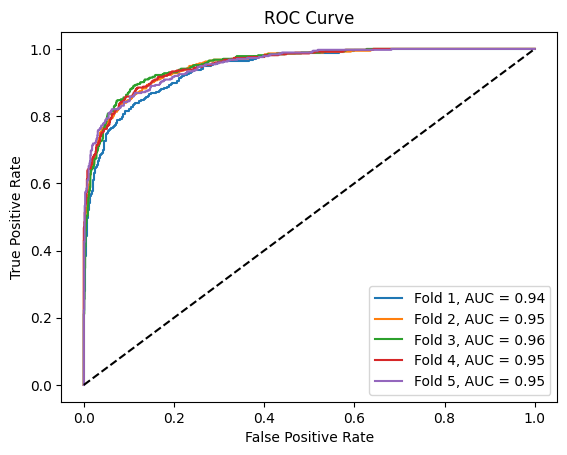

Fold 1: Accuracy = 0.56
Fold 2: Accuracy = 0.91
Fold 3: Accuracy = 0.90
Fold 4: Accuracy = 0.90
Fold 5: Accuracy = 0.91


In [ ]:
#Gradient Boosting Classifier
result = stratified_train(X, y, ensemble.GradientBoostingClassifier)

### Support Vector Machine Classifer

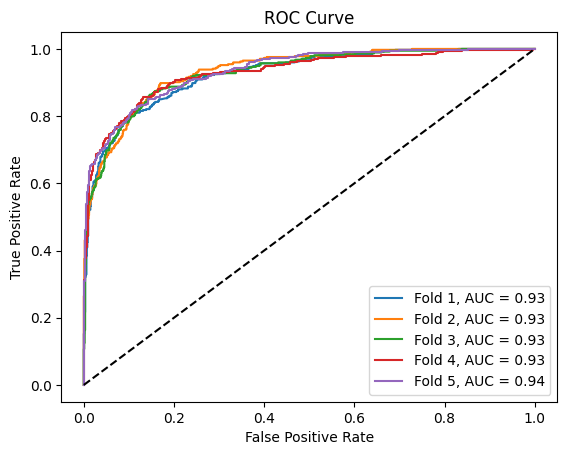

Fold 1: Accuracy = 0.84
Fold 2: Accuracy = 0.88
Fold 3: Accuracy = 0.87
Fold 4: Accuracy = 0.89
Fold 5: Accuracy = 0.89


In [ ]:
#Support Vector Machine Classifier
result = stratified_train(X, y, svm.SVC)

### Random Forest Classifier

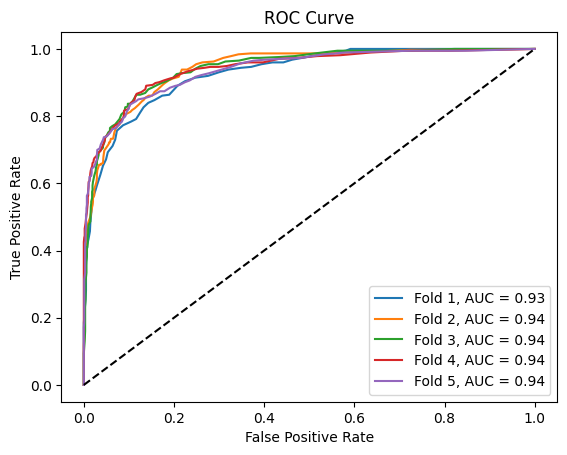

Fold 1: Accuracy = 0.60
Fold 2: Accuracy = 0.88
Fold 3: Accuracy = 0.89
Fold 4: Accuracy = 0.89
Fold 5: Accuracy = 0.89


In [ ]:
#Ranfom Forest Classifier
result = stratified_train(X, y, ensemble.RandomForestClassifier)

### K Neighbors

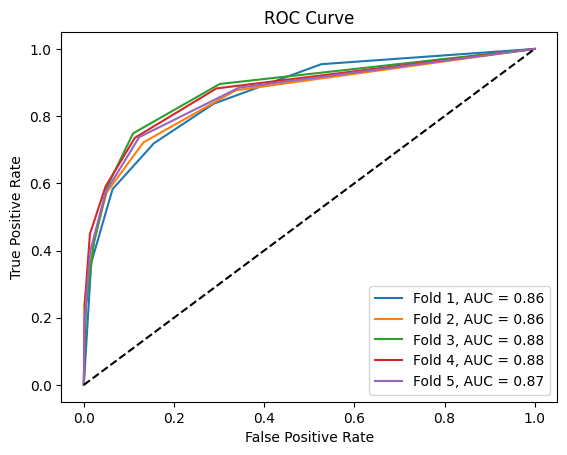

Fold 1: Accuracy = 0.81
Fold 2: Accuracy = 0.85
Fold 3: Accuracy = 0.85
Fold 4: Accuracy = 0.86
Fold 5: Accuracy = 0.85


In [ ]:
#K Neighbour
result = stratified_train(X, y, neighbors.KNeighborsClassifier)

### Logistic Regression

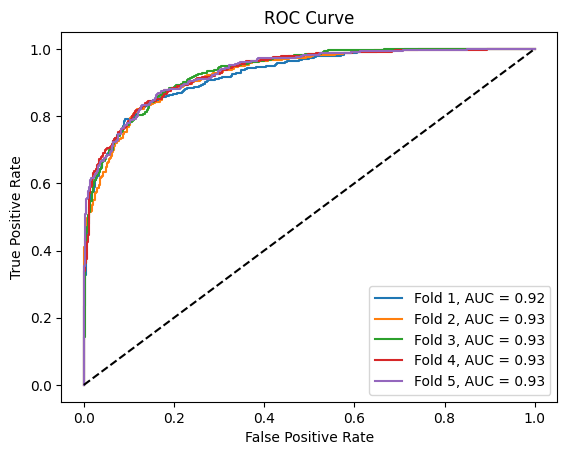

Fold 1: Accuracy = 0.87
Fold 2: Accuracy = 0.87
Fold 3: Accuracy = 0.88
Fold 4: Accuracy = 0.89
Fold 5: Accuracy = 0.88


In [ ]:
#Logistic Regression
result = stratified_train(X, y, linear_model.LogisticRegression)

### eXTreme Gradient Boosting Classifier

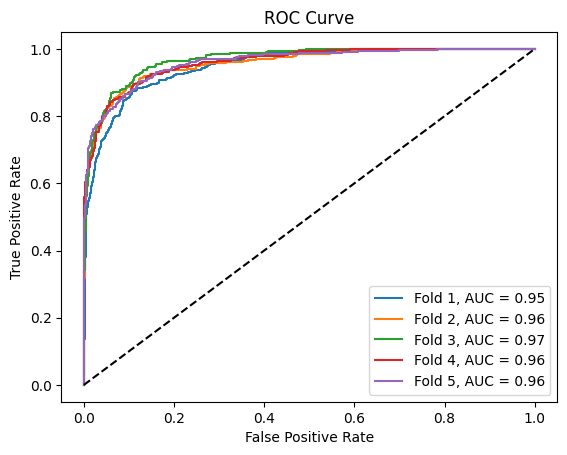

Fold 1: Accuracy = 0.66
Fold 2: Accuracy = 0.91
Fold 3: Accuracy = 0.91
Fold 4: Accuracy = 0.91
Fold 5: Accuracy = 0.92


In [ ]:
#eXtreme Gradient Boosting Classifier (Advance ver. of GBC)
result = stratified_train(X, y, XGBClassifier)

# **Random Forest Classifier**

In [ ]:
df_og = pd.read_csv("https://raw.githubusercontent.com/Cebelle1/SC1015Project/main/telco_churn_data.csv")
rf_data = df_og
#Combine the columns Streaming TV/ Streaming Movies/ Streaming Music - new column
def categorise(row):
  if row['Streaming TV'] == "Yes" or row['Streaming Movies'] == "Yes" or row['Streaming Music'] == "Yes":
    return "Yes"
  else:
    return "No"

#Categorising the Age values into groups i.e. Below 39 (Adult), 40-60 (Middle-Aged), 61+ (Elderly)
# def categorise2(row):
#   if row("Age") < 40:
#     return "Below 39"
#   elif 41 < row("Age") < 61:
#     return "40 to 60"
#   elif row("Age") > 60:
#     return "61+"

rf_data["Streaming"] = df_og.apply(lambda row: categorise(row), axis=1)
# rf_data["Age Range"] = df_og.apply(lambda row: categorise2(row), axis=1)

df_rf= pd.DataFrame( rf_data[['Tenure in Months','Avg Monthly Long Distance Charges','Avg Monthly GB Download',
                      'Monthly Charge','Age','CLTV','Total Customer Svc Requests','Total Regular Charges',
                       'Number of Referrals','Total Refunds', 'Total Extra Data Charges','Total Long Distance Charges',
                       'Number of Dependents','Product/Service Issues Reported','Offer','Phone Service','Internet Service','Online Security','Streaming',
                       'Contract','Dependents','Multiple Lines','Churn Value']])
df_rf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 23 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Tenure in Months                   7043 non-null   int64  
 1   Avg Monthly Long Distance Charges  7043 non-null   float64
 2   Avg Monthly GB Download            7043 non-null   int64  
 3   Monthly Charge                     7043 non-null   float64
 4   Age                                7043 non-null   int64  
 5   CLTV                               7043 non-null   int64  
 6   Total Customer Svc Requests        7043 non-null   int64  
 7   Total Regular Charges              7043 non-null   float64
 8   Number of Referrals                7043 non-null   int64  
 9   Total Refunds                      7043 non-null   float64
 10  Total Extra Data Charges           7043 non-null   float64
 11  Total Long Distance Charges        7043 non-null   float

### RFC - Creating numerical and categorical lists



In [ ]:
#Creating numerical and categorical lists
rf_columns = list(df_rf.columns)

rf_categoric_columns = []
rf_numeric_columns = []

for i in rf_columns:
    if len(df_og[i].unique()) > 6:
        rf_numeric_columns.append(i)
    else:
        rf_categoric_columns.append(i)

rf_categoric_columns = rf_categoric_columns[:-1] # Excluding 'Churn'
print(rf_numeric_columns)
print(rf_categoric_columns)

['Tenure in Months', 'Avg Monthly Long Distance Charges', 'Avg Monthly GB Download', 'Monthly Charge', 'Age', 'CLTV', 'Total Customer Svc Requests', 'Total Regular Charges', 'Number of Referrals', 'Total Refunds', 'Total Extra Data Charges', 'Total Long Distance Charges', 'Number of Dependents', 'Product/Service Issues Reported']
['Offer', 'Phone Service', 'Internet Service', 'Online Security', 'Streaming', 'Contract', 'Dependents', 'Multiple Lines']


### RFC - Catagorical Data - Label Encoding

In [ ]:
# Label Encoding refers to converting the labels into a numeric form. 
# This is only for EDA reasons. Later we will use OneHotEncoder to prepare for model building.


df_rf_final = df_rf.copy()

df_rf_final[rf_categoric_columns] = df_rf_final[rf_categoric_columns].apply(le.fit_transform)
df_rf_final[['Churn Value']] = df_rf_final[['Churn Value']].apply(le.fit_transform)

### RFC - Numeric Data - Basic Statistics

In [ ]:
df_rf_final[rf_numeric_columns].describe()

,Tenure in Months,Avg Monthly Long Distance Charges,Avg Monthly GB Download,Monthly Charge,Age,CLTV,Total Customer Svc Requests,Total Regular Charges,Number of Referrals,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Number of Dependents,Product/Service Issues Reported
count,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000
mean,32.386767,22.958954,21.110890,65.538800,46.509726,4400.295755,1.338776,2280.381264,1.951867,1.962182,278.499225,749.099262,0.468692,0.308107
std,24.542061,15.448113,20.948471,30.606805,16.750352,1183.057152,1.430471,2266.220462,3.001199,7.902614,685.039625,846.660055,0.962802,0.717514
min,1.000000,0.000000,0.000000,18.250000,19.000000,2003.000000,0.000000,18.800000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,9.000000,9.210000,3.000000,35.890000,32.000000,3469.000000,0.000000,400.150000,0.000000,0.000000,0.000000,70.545000,0.000000,0.000000
50%,29.000000,22.890000,17.000000,71.968000,46.000000,4527.000000,1.000000,1394.550000,0.000000,0.000000,0.000000,401.440000,0.000000,0.000000
75%,55.000000,36.395000,28.000000,90.650000,60.000000,5380.500000,2.000000,3786.600000,3.000000,0.000000,182.620000,1191.100000,0.000000,0.000000
max,72.000000,49.990000,94.000000,123.084000,80.000000,6500.000000,9.000000,8684.800000,11.000000,49.790000,6477.000000,3564.720000,9.000000,6.000000


### RFC - Model Trainng RFC

##### RFC - Model Training - Train Test Split

In [ ]:
df_rf3= df_rf
df_rf3[['Churn Value']] = df_rf3[['Churn Value']].apply(le.fit_transform) # Applying LabelEncoder to 'Churn' column

X_rf = df_rf3.drop('Churn Value', axis=1)#  Predictor (X)
Y_rf = df_rf3['Churn Value'] # Response (Y)

# Train Set and test set
X_train_rf, X_test_rf, Y_train_rf, Y_test_rf = train_test_split(X_rf, Y_rf, test_size=0.2, random_state=4)

# Check the sample sizes
print("Train Set :",X_train_rf.shape, Y_train_rf.shape)
print("Test Set  :",X_test_rf.shape, Y_test_rf.shape)

Train Set : (5634, 22) (5634,)
Test Set  : (1409, 22) (1409,)


##### RFC - Model Training - Feature Scaling - normalization for numerical data

In [ ]:

Standard_Scaler = StandardScaler()
Standard_Scaler.fit_transform(X_train_rf[rf_numeric_columns])
Standard_Scaler.transform(X_test_rf[rf_numeric_columns])

array([[ 1.57463096,  1.66893495,  2.39090599, ...,  3.21923953,
         2.65529063, -0.4301027 ],
       [-1.19298499,  1.63910049,  1.00443645, ..., -0.71766115,
        -0.48139669, -0.4301027 ],
       [ 0.39432416, -1.49351736,  0.23948774, ..., -0.88963782,
        -0.48139669, -0.4301027 ],
       ...,
       [-0.41968053, -1.38066529,  3.06023611, ..., -0.84420464,
        -0.48139669, -0.4301027 ],
       [-1.23368523,  1.45166228, -0.04736803, ..., -0.78184678,
        -0.48139669, -0.4301027 ],
       [ 1.00482768, -1.3936368 , -0.2864145 , ..., -0.78545485,
         0.56416575, -0.4301027 ]])

##### RFC - Model Training - One hot encoder - encoding for catagorical data

In [ ]:
print(rf_categoric_columns)

# Encoding multiple columns. Unfortunately you cannot pass a list here so you need to copy-paste all printed categorical columns.
transformer = make_column_transformer(
    (OneHotEncoder(handle_unknown='ignore'), 
     ['Offer', 'Phone Service', 'Internet Service', 'Online Security', 'Streaming', 'Contract', 'Dependents', 'Multiple Lines']))

['Offer', 'Phone Service', 'Internet Service', 'Online Security', 'Streaming', 'Contract', 'Dependents', 'Multiple Lines']


In [ ]:
# Transforming train set
transformed = transformer.fit_transform(X_train_rf)
# Transformating back
transformed_df = pd.DataFrame(transformed, columns=transformer.get_feature_names_out())
# One-hot encoding removed index. Let's put it back:
transformed_df.index = X_train_rf.index

# Joining tables FOR TRAIN!!
X_train_rf = pd.concat([X_train_rf, transformed_df], axis=1)

X_train_rf.drop(rf_categoric_columns, axis=1, inplace=True) # Dropping categorical columns
##==============================================================================================

# Transforming test set
transformed = transformer.transform(X_test_rf)
# Transformating back
transformed_df = pd.DataFrame(transformed, columns=transformer.get_feature_names_out())
# One-hot encoding removed index. Let's put it back:
transformed_df.index = X_test_rf.index

# Joining tables FOR TEST!!!
X_test_rf = pd.concat([X_test_rf, transformed_df], axis=1)

X_test_rf.drop(rf_categoric_columns, axis=1, inplace=True) # Dropping categorical columns

##### RFC - Model Training - Model Building


In [ ]:


# Renaming the columns 
X_train_rf.columns = ['Tenure in Months', 'Avg Monthly Long Distance Charges',
       'Avg Monthly GB Download', 'Monthly Charge', 'Age', 'CLTV','Total Customer Svc Requests', 'Total Regular Charges','Number of Referrals', 'Total Refunds', 'Total Extra Data Charges',
       'Total Long Distance Charges', 'Number of Dependents','Product/Service Issues Reported', 
       'Offer_None','Offer_Offer A', 'Offer_Offer B','_Offer_Offer C', 'Offer_Offer D','Offer_Offer E', 
       'Phone Service_No','Phone Service_Yes', 'Internet Service_No','Internet Service_Yes',
       'Online Security_No','Online Security_Yes', 'Streaming_No','Streaming_Yes',
       'Contract_Month-to-Month','Contract_One Year', 'Contract_Two Year','Dependents_No', 'Dependents_Yes','Multiple Lines_No','Multiple Lines_Yes']

X_test_rf.columns = ['Tenure in Months', 'Avg Monthly Long Distance Charges',
       'Avg Monthly GB Download', 'Monthly Charge', 'Age', 'CLTV','Total Customer Svc Requests', 'Total Regular Charges','Number of Referrals', 'Total Refunds', 'Total Extra Data Charges',
       'Total Long Distance Charges', 'Number of Dependents','Product/Service Issues Reported', 
       'Offer_None','Offer_Offer A', 'Offer_Offer B','_Offer_Offer C', 'Offer_Offer D','Offer_Offer E', 
       'Phone Service_No','Phone Service_Yes', 'Internet Service_No','Internet Service_Yes',
       'Online Security_No','Online Security_Yes', 'Streaming_No','Streaming_Yes',
       'Contract_Month-to-Month','Contract_One Year', 'Contract_Two Year','Dependents_No', 'Dependents_Yes','Multiple Lines_No','Multiple Lines_Yes']

In [ ]:
clf = RandomForestClassifier(max_depth=8, min_samples_leaf=3, min_samples_split=3, n_estimators=10, random_state=13)
clf = clf.fit(X_train_rf, Y_train_rf)

print("Accuracy: " ,clf.score (X_train_rf,Y_train_rf))

Accuracy:  0.9077032303869365


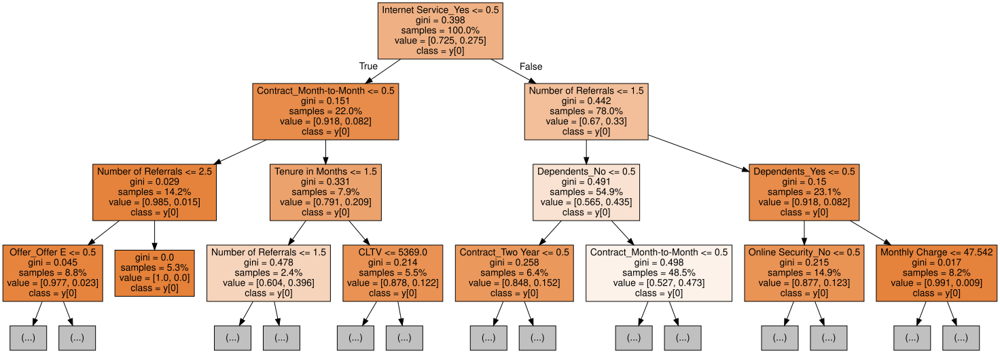

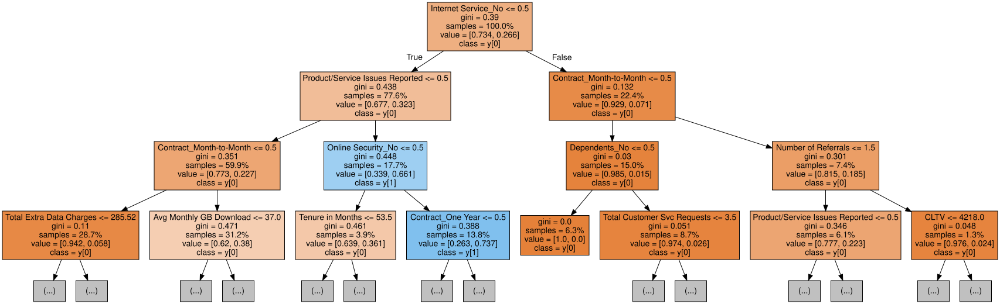

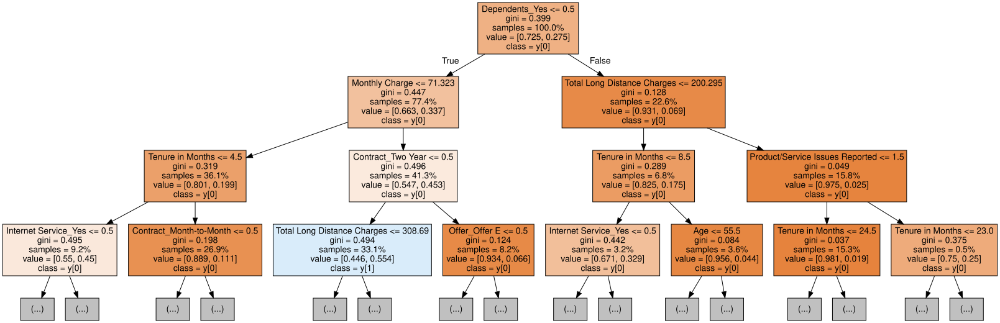

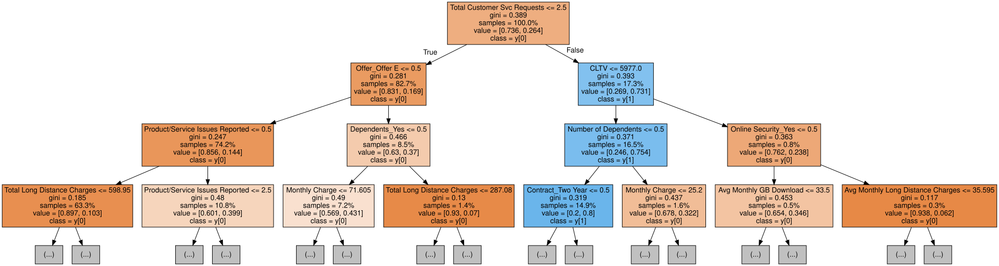

In [ ]:
for i in range(4):
    tree = clf.estimators_[i]
    dot_data = export_graphviz(tree,
                               feature_names=X_train_rf.columns, class_names= True, filled=True,  
                               max_depth=3, impurity=True, proportion=True)
    graph = graphviz.Source(dot_data)
    display(graph)

              precision    recall  f1-score   support

           0       0.91      0.97      0.94      4126
           1       0.90      0.74      0.81      1508

    accuracy                           0.91      5634
   macro avg       0.90      0.85      0.87      5634
weighted avg       0.91      0.91      0.90      5634



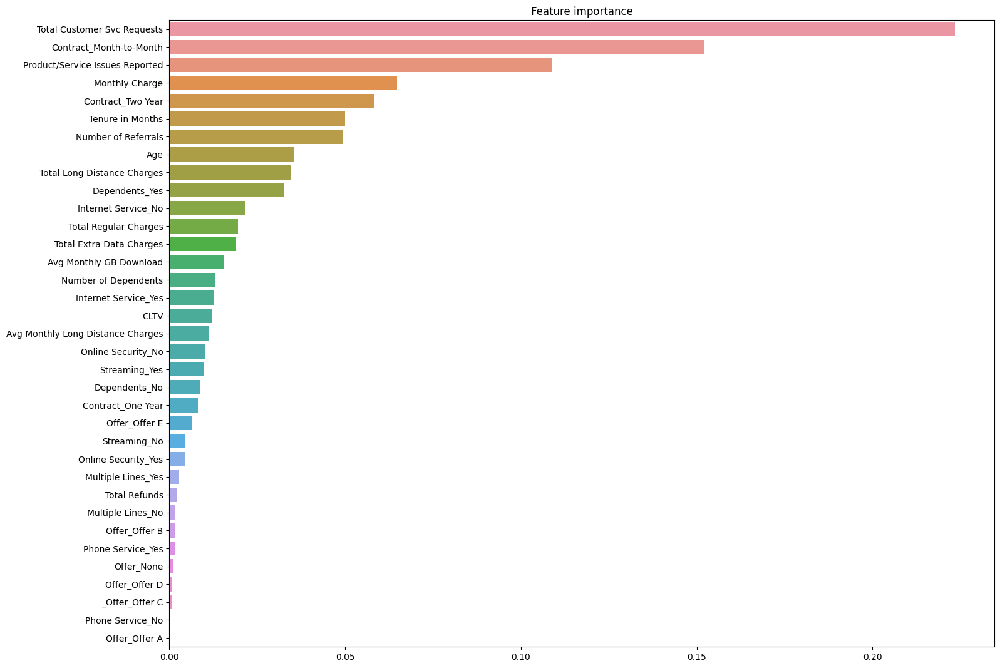

In [ ]:
Y_pred_train = clf.predict(X_train_rf)
print(classification_report(Y_train_rf, Y_pred_train))

## Important features base from the model
fimp = pd.Series(data=clf.feature_importances_, index=X_train_rf.columns).sort_values(ascending=False)
plt.figure(figsize=(17,13))
plt.title("Feature importance")
ax = sb.barplot(y=fimp.index, x=fimp.values, orient='h')
plt.show()

### RFC - Testing Random Forest Model with test dataset

In [ ]:
print("===RFC on train dataset===\n")
print(classification_report(Y_train_rf, Y_pred_train))

Y_pred_test = clf.predict(X_test_rf)
print("====RFC on test dataset===\n")
print(classification_report(Y_test_rf, Y_pred_test))

===RFC on train dataset===

              precision    recall  f1-score   support

           0       0.91      0.97      0.94      4126
           1       0.90      0.74      0.81      1508

    accuracy                           0.91      5634
   macro avg       0.90      0.85      0.87      5634
weighted avg       0.91      0.91      0.90      5634

====RFC on test dataset===

              precision    recall  f1-score   support

           0       0.91      0.97      0.94      1048
           1       0.88      0.71      0.79       361

    accuracy                           0.90      1409
   macro avg       0.90      0.84      0.86      1409
weighted avg       0.90      0.90      0.90      1409



#### RFC - Testing Random Forest Model with test dataset - K-Fold Cross-validation

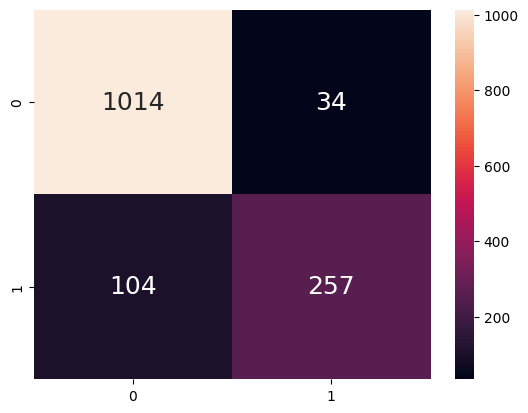



===K-Fold Cross-validation for RFC===

Cross Validation Recall scores are: [0.70431894 0.69205298 0.6589404  0.64569536 0.68106312]
Average Cross Validation Recall score:  0.6764141603045037
Cross Validation Recall standard deviation:  0.023947019220121678




,Model,Recall,Precision,F1 Score,Accuracy,ROC-AUC Score,Avg CV Recall,Standard Deviation of CV Recall
0,Random Forest,0.711911,0.883162,0.788344,0.902058,0.839734,0.676414,0.023947


In [ ]:


rf_Recall = recall_score(Y_test_rf, Y_pred_test)
rf_Precision = precision_score(Y_test_rf, Y_pred_test)
rf_f1 = f1_score(Y_test_rf, Y_pred_test)
rf_accuracy = accuracy_score(Y_test_rf, Y_pred_test)
rf_roc_auc = roc_auc_score(Y_test_rf, Y_pred_test)

cm_1 = confusion_matrix(Y_test_rf, Y_pred_test)
sb.heatmap(cm_1, annot = True, fmt=".0f", annot_kws={"size": 18})

plt.show()
#print(cm_1)
print("\n")
##==================================================================================================

print("===K-Fold Cross-validation for RFC===\n")
score = cross_val_score(clf, X_train_rf, Y_train_rf, cv=5, scoring='recall', error_score="raise")
rf_cv_score = score.mean()
rf_cv_stdev = stdev(score)
print('Cross Validation Recall scores are: {}'.format(score))
print('Average Cross Validation Recall score: ', rf_cv_score)
print('Cross Validation Recall standard deviation: ', rf_cv_stdev)
##=======================================================================================================
print ("\n")
ndf = [(rf_Recall, rf_Precision, rf_f1, rf_accuracy, rf_roc_auc, rf_cv_score, rf_cv_stdev)]
rf_score = pd.DataFrame(data = ndf, columns=['Recall','Precision','F1 Score', 'Accuracy', 'ROC-AUC Score', 'Avg CV Recall', 'Standard Deviation of CV Recall'])
rf_score.insert(0, 'Model', 'Random Forest')
rf_score

Recall score: 0.71 means that in this particular situation we were able to correctly detect 71% of churning customers.

Precision: 0.88 tells us that when our model predicts a churn customer we have a 88% chance that the prediction is accurate (we detected a churn customer).

F1 Score: 0.79 tells us how efficient our model is, taking into account both: Recall and Precision scores. This shows a reasonable balance between both reacall and precision scores.

Accuracy: 0.90 tells us that the number of correct predictions (churn and not churn) made by a model in relation to the total number of predictions are 90%. Accuracy is not a good score for imbalanced data set.

ROC-AUC Score: 0.84 tells us that the model is quite efficient at distinguishing between the churn customers and not churn customers.

Avg CV Recall: A score of 0.6764 means that on average, the model correctly identified 67.64% of the churned customers during cross-validation.

Standard Deviation of CV Recall: 0.023 tell us about expected differences with Recall Score. This suggests that the model is not very sensitive to changes in the training data.


/////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////

Overall, the fact that the model has a good recall score but a lower average CV recall suggests that there may be some overfitting or other issues with the model's generalization ability. We explore more by using XGBOOST classifier

# XG BOOST Classifier With K fold validation

In [ ]:
XGBC = XGBClassifier()
XGBC.fit(X_train_rf, Y_train_rf)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)



===K-Fold Cross-validation for XGBoost===

Cross Validation Recall scores are: [0.80066445 0.8013245  0.79801325 0.80463576 0.79401993]
Average Cross Validation Recall score:  0.7997315790631669
Cross Validation Recall standard deviation:  0.003969705019162447




,Model,Recall,Precision,F1 Score,Accuracy,ROC-AUC Score,Avg CV Recall,Standard Deviation of CV Recall
0,XGBC,0.819945,0.919255,0.866764,0.935415,0.897568,0.799732,0.00397


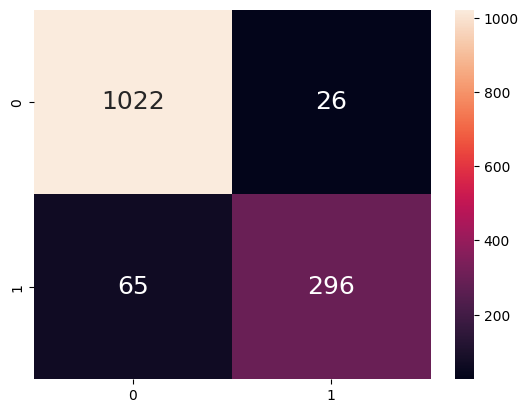

In [ ]:
y_pred_XG = XGBC.predict(X_test_rf)

XGBC_Recall = recall_score(Y_test_rf, y_pred_XG)
XGBC_Precision = precision_score(Y_test_rf, y_pred_XG)
XGBC_f1 = f1_score(Y_test_rf, y_pred_XG)
XGBC_accuracy = accuracy_score(Y_test_rf, y_pred_XG)
XGBC_roc_auc = roc_auc_score(Y_test_rf, y_pred_XG)

cm = confusion_matrix(Y_test_rf, y_pred_XG)
sb.heatmap(cm, annot = True, fmt=".0f", annot_kws={"size": 18})

#print(cm)
print ("\n")
##==================================================================================================

print("===K-Fold Cross-validation for XGBoost===\n")

score = cross_val_score(XGBC, X_train_rf, Y_train_rf, cv=5, scoring='recall', error_score="raise")
XGBC_cv_score = score.mean()
XGBC_cv_stdev = stdev(score)
print('Cross Validation Recall scores are: {}'.format(score))
print('Average Cross Validation Recall score: ', XGBC_cv_score)
print('Cross Validation Recall standard deviation: ', XGBC_cv_stdev)
print ("\n")
##=========================================================================================================

ndf = [(XGBC_Recall, XGBC_Precision, XGBC_f1, XGBC_accuracy, XGBC_roc_auc, XGBC_cv_score, XGBC_cv_stdev)]
XGBC_score = pd.DataFrame(data = ndf, columns=['Recall','Precision','F1 Score', 'Accuracy', 'ROC-AUC Score', 'Avg CV Recall', 'Standard Deviation of CV Recall'])
XGBC_score.insert(0, 'Model', 'XGBC')
XGBC_score

From these results, it appears that the XGBoost model outperforms the Random Forest model in all metrics except for the ROC-AUC score. The XGBoost model has higher recall, precision, F1 score, accuracy, and average CV recall. Additionally, the XGBoost model has a smaller standard deviation of CV recall, suggesting that it may be more stable and less sensitive to changes in the training data. Overall, it seems like the XGBoost model is a better choice for this churn prediction problem.

### XG BOOST CLAS - Hyperparameter Tuning Using GridSearchCV
FOR THIS ONE I MIGHT JUST DELETE SINCE ITS USELESS HAHAHA

In [ ]:

# Step 1: Searching for the optimum parameters for the learning rate and the number of estimators:
params = {'learning_rate': [0.01], #[0.0001, 0.001, 0.01, 0.1, 0.2, 0.3],
              'subsample': [0.8],
              'colsample_bytree': [0.8],
              'n_estimators': [450] #range(50,500,50),
              }

grid_xgb = GridSearchCV(XGBC, param_grid=params, cv=5, scoring='recall').fit(X_train_rf, Y_train_rf)
##==============================================================================================
print('Best parameters:', grid_xgb.best_params_)
print('Best score:', grid_xgb.best_score_)

Best parameters: {'colsample_bytree': 0.8, 'learning_rate': 0.01, 'n_estimators': 450, 'subsample': 0.8}
Best score: 0.7665837935358957


In [ ]:
# Step 2: Searching for the optimum parameters for max_depth and min_child_weight:
params = {'max_depth': [7], #range(3,10,2),
              'learning_rate': [0.01],
              'subsample': [0.8],
              'colsample_bytree': [0.8],
              # 'colsample_bylevel': np.arange(0.5, 1.0, 0.1),
              'min_child_weight': [5], #range(1,6,2),
              'n_estimators': [450],
              # 'num_class': [10]
              }

grid_xgb = GridSearchCV(XGBC, param_grid=params, cv=5, scoring='recall').fit(X_train_rf, Y_train_rf)
##==============================================================================================
print('Best parameters:', grid_xgb.best_params_)
print('Best score:', grid_xgb.best_score_)

Best parameters: {'colsample_bytree': 0.8, 'learning_rate': 0.01, 'max_depth': 7, 'min_child_weight': 5, 'n_estimators': 450, 'subsample': 0.8}
Best score: 0.7685683483311698


In [ ]:
y_pred_grid= grid_xgb.predict(X_test_rf)

grid_xgb_Recall = recall_score(Y_test_rf, y_pred_grid)
grid_xgb_Precision = precision_score(Y_test_rf, y_pred_grid)
grid_xgb_f1 = f1_score(Y_test_rf, y_pred_grid)
grid_xgb_accuracy = accuracy_score(Y_test_rf, y_pred_grid)
grid_xgb_roc_auc = roc_auc_score(Y_test_rf, y_pred_grid)

cm_2 = confusion_matrix(Y_test_rf, y_pred_grid)
print(cm_2)
print ("\n")
##==================================================================================================

print("===K-Fold Cross-validation for GridSearchCV===\n")
score = cross_val_score(grid_xgb, X_train_rf, Y_train_rf, cv=5, scoring='recall', error_score="raise")
grid_xgb_cv_score = score.mean()
grid_xgb_cv_stdev = stdev(score)
print('Cross Validation Recall scores are: {}'.format(score))
print('Average Cross Validation Recall score: ', grid_xgb_cv_score)
print('Cross Validation Recall standard deviation: ', grid_xgb_cv_stdev)
print ("\n")
##==================================================================================================

ndf = [(grid_xgb_Recall, grid_xgb_Precision, grid_xgb_f1, grid_xgb_accuracy, grid_xgb_roc_auc, grid_xgb_cv_score, grid_xgb_cv_stdev)]
grid_xgb_score = pd.DataFrame(data = ndf, columns=['Recall','Precision','F1 Score', 'Accuracy', 'ROC-AUC Score', 'Avg CV Recall', 'Standard Deviation of CV Recall'])
grid_xgb_score.insert(0, 'Model', 'Tuned XGBC')
grid_xgb_score


[[1021   27]
 [  84  277]]


===K-Fold Cross-validation for GridSearchCV===

Cross Validation Recall scores are: [0.77076412 0.7781457  0.75827815 0.76821192 0.76744186]
Average Cross Validation Recall score:  0.7685683483311698
Cross Validation Recall standard deviation:  0.007138474515584162




,Model,Recall,Precision,F1 Score,Accuracy,ROC-AUC Score,Avg CV Recall,Standard Deviation of CV Recall
0,Tuned XGBC,0.767313,0.911184,0.833083,0.921221,0.870775,0.768568,0.007138


# COMPARE THE DIFFERENT SCORES 

-RANDOM FOREST

-XGBOOST

-XGBOOT after (Hyperparameter Tuning Using GridSearchCV)

In [ ]:
rf_score

,Model,Recall,Precision,F1 Score,Accuracy,ROC-AUC Score,Avg CV Recall,Standard Deviation of CV Recall
0,Random Forest,0.711911,0.883162,0.788344,0.902058,0.839734,0.676414,0.023947


In [ ]:
XGBC_score

,Model,Recall,Precision,F1 Score,Accuracy,ROC-AUC Score,Avg CV Recall,Standard Deviation of CV Recall
0,XGBC,0.819945,0.919255,0.866764,0.935415,0.897568,0.799732,0.00397


In [ ]:
grid_xgb_score

,Model,Recall,Precision,F1 Score,Accuracy,ROC-AUC Score,Avg CV Recall,Standard Deviation of CV Recall
0,Tuned XGBC,0.767313,0.911184,0.833083,0.921221,0.870775,0.768568,0.007138


Overall, Gridsearch did not do as well as both XGboost and Random Forest. Random Forest and XGboost main differnce is the average CV Recall. Recall measures the ability of a classifier to correctly identify positive samples from a total of actual positive samples in the dataset. 

XGBoost Avg CV recall: 0.90.
Random Forest Avg CV recall: 0.68.
Therefore, XGBoost is a much better model than Random Forest

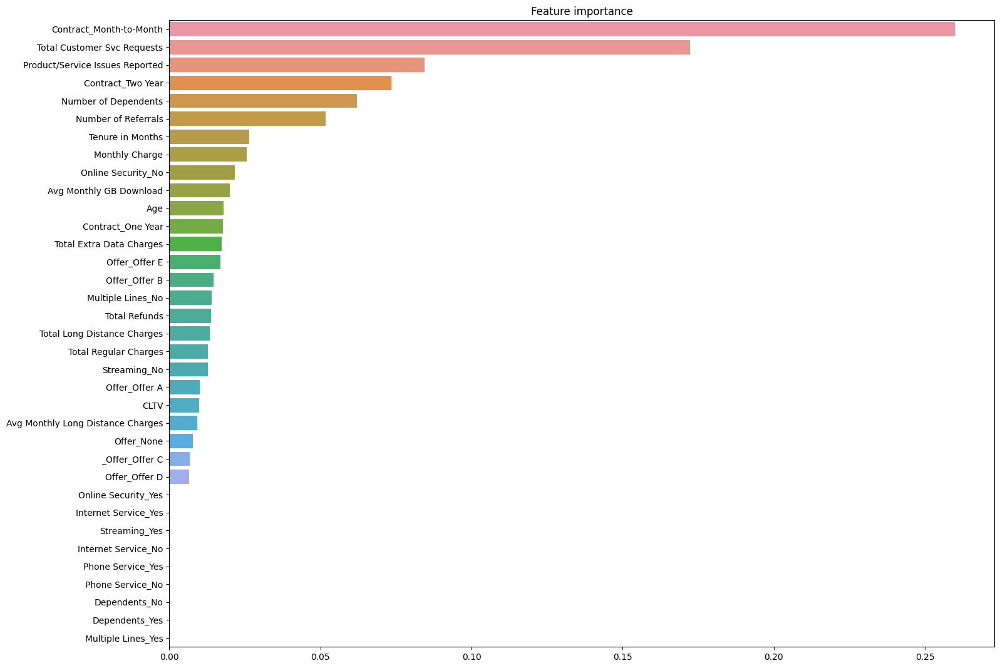

In [ ]:
## Important features base from the model
fimp = pd.Series(data=XGBC.feature_importances_, index=X_train_rf.columns).sort_values(ascending=False)
plt.figure(figsize=(17,13))
plt.title("Feature importance")
ax = sb.barplot(y=fimp.index, x=fimp.values, orient='h')
plt.show()